# Рынок заведений общественного питания Москвы

**Цели проекта:** подготовить исследование рынка заведений общественного питания Москвы; подготовить рекомендации по перспективным направления инвестирования в сфере общепита.

**Задачи проекта:** 
- провести предобработку имеющихся данных
- провести анализ данных
- подготовить рекомендации для инвест. проекта

**Исходные данные:** датасет с заведениями общественного питания Москвы.

*Исходные данные*
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    - «Средний счёт: 1000–1500 ₽»;
    - «Цена чашки капучино: 130–220 ₽»;
    - «Цена бокала пива: 400–600 ₽». и так далее;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    - 0 — заведение не является сетевым
    - 1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

## Загрузка данных, изучение общей информации

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
from plotly import graph_objects as go
import numpy as np
import seaborn as sns
import re
import json
from folium import Map, Choropleth
from folium import Marker, Map
from folium.plugins import MarkerCluster
import io
import plotly.io as pio
pio.renderers.default = 'colab'

In [3]:
from google.colab import files
 
 
uploaded = files.upload()

Saving moscow_places.csv to moscow_places.csv


In [4]:
df = pd.read_csv(io.BytesIO(uploaded['moscow_places.csv']))
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


## Предобработка данных

Видно, что в исходном датасете есть пропуски в данных в столбцах с:
- информацией о днях и часах работы. Восстановить пропуски нечем, т.к. этот параметр не зависит откаких-либо других.
- категорией цен в заведении. Теоретически можно разбить на диапазоны данные из других столбцов с ценами - выявить закономерности между категориями и заполнить пропуски в данном столбце. Но для этого нужно, чтобы столбцы с ценовой информацией были дозаполнены.
- средней стоимостью заказа. Думаю, этот столбец носит справочный характер и является источником данных для других столбцов со средней ценой. Намного важнее заполнить пропуски в них, чем в этом столбце.
- оценкой среднего чека. Данные можно будет взять из предыдущего столбца со средней стоимоимостью заказа, если они там присутствуют. Если нет - можно выявить медианный средний чек для ценовой категории заведения, его сегмента и рейона его расположения.
- ценой одной чашки капучино. Скорее всего этот показатель более актуален для кофеен и по сути является средним чеком для этой категории заведений. Заполнить информацию скорее всего можно будет из столбца со средней стоимость заказа.
- информацией о количестве посадочных мест. Для оценки примерного оборота заведения в сутки это был бы важный показатель, формирующий выручку - один из ключевых критериев инвестиционной привлекательности. К сожалению, данные не восстановить, придется заменить пропуски на 0.

С точки зрения типов данных я бы скорректировала столбец с типом заведения (сетевое/не сетевое) на булев тип.


### Изменение типов данных

In [6]:
#Скорректируем типы данных
df['chain']=df['chain'].astype('bool')
#Проверим, что типы данных встали корректно
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   bool   
 13  seats              4795 non-null   float64
dtypes: bool(1), float64(6), object(7)
memory usage: 862.1+ KB


### Поиск дубликатов

In [7]:
#Проверим явные дубликаты
df.duplicated().sum()

0

In [8]:
#Проверим неявные дубликаты
#Сделаем столбец с названием заведения и адресом, приведем к нижнему регистру
df['name_address'] = (df['name'] + df['address']).str.lower()
#Проверим наличие дубликатов
df.duplicated(subset='name_address').sum()

4

In [9]:
#Удалим дубликаты
df=df.drop_duplicates(subset='name_address', keep='first')
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8402 entries, 0 to 8405
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8402 non-null   object 
 1   category           8402 non-null   object 
 2   address            8402 non-null   object 
 3   district           8402 non-null   object 
 4   hours              7867 non-null   object 
 5   lat                8402 non-null   float64
 6   lng                8402 non-null   float64
 7   rating             8402 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8402 non-null   bool   
 13  seats              4792 non-null   float64
 14  name_address       8402 non-null   object 
dtypes: bool(1), float64(6), object(8)
memory usage: 992.8+ KB


### Заполнение пропусков

In [10]:
#Уточним, какие категории заведений есть в датасете
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [11]:
#Проверим, для каких категорий заведений заполнен столбец middle_coffee_cup и попробуем оценить, 
#пригодна ли эта ифнормация для оценки среднего чека.
df[df['middle_coffee_cup'].notna()]['category'].unique()

array(['кофейня', 'кафе', 'пиццерия', 'бар,паб', 'быстрое питание'],
      dtype=object)

Можем ли мы взять информацию из столбца middle_coffee_cup, чтобы заполнить средний чек? Думаю нет, данные будут занижены. Возможно для такой категории, как "кофейни" или "быстрое питание" это и было бы относительно показательным, но для всех остальных категорий - нет.

Теперь проверим столбцы, где заполнен avg_bill и не заполнен middle_avg_bill. Посмотрим, что это за категории заведений, а заодно изучим, какая информация осталась в avg_bill.

In [12]:
df[df['avg_bill'].notna() & df['middle_avg_bill'].isnull()]['category'].unique()

array(['кофейня', 'бар,паб', 'кафе', 'пиццерия', 'быстрое питание'],
      dtype=object)

In [13]:
df[df['avg_bill'].notna() & df['middle_avg_bill'].isnull()]['avg_bill'].unique()

array(['Цена чашки капучино:155–185 ₽', 'Цена бокала пива:250–350 ₽',
       'Цена бокала пива:120–350 ₽', 'Цена чашки капучино:150–190 ₽',
       'Цена чашки капучино:120–170 ₽', 'Цена чашки капучино:100–200 ₽',
       'Цена бокала пива:90–230 ₽', 'Цена чашки капучино:150–210 ₽',
       'Цена чашки капучино:80–160 ₽', 'Цена чашки капучино:100 ₽',
       'Цена чашки капучино:239–274 ₽', 'Цена чашки капучино:130–190 ₽',
       'Цена бокала пива:160–499 ₽', 'Цена чашки капучино:200–300 ₽',
       'Цена чашки капучино:150–180 ₽', 'Цена чашки капучино:119–179 ₽',
       'Цена чашки капучино:100–170 ₽', 'Цена чашки капучино:200–240 ₽',
       'Цена чашки капучино:150–200 ₽', 'Цена бокала пива:199–300 ₽',
       'Цена бокала пива:от 140 ₽', 'Цена бокала пива:от 149 ₽',
       'Цена бокала пива:150–450 ₽', 'Цена чашки капучино:150–240 ₽',
       'Цена чашки капучино:от 60 ₽', 'Цена чашки капучино:120–180 ₽',
       'Цена чашки капучино:179–249 ₽', 'Цена чашки капучино:75 ₽',
       'Цена чашк

У нас осталась информация о цене за чашку капучино или за бокал пива. Не для всех категорий заведений эти данные можно сопоставить со средним чеком, поэтому данными из avg_bill нельзя заполнить целевой столбец с middle_avg_bill.

Я прихожу к выводу, что имеющаяся информация в avg_bill и middle_coffee_cup не особа пригодна для заполнения пропусков в middle_avg_bill. 

Заполнять данные считаю нецелесообразным, т.к. это может исказить итоговые результаты. Попробуем по имеющимся данным дозаполнить столбец с ценовой категорией заведения. Для этого определим, какие диапазоны средних чеков попадают в каждую ценовую категорию.

''

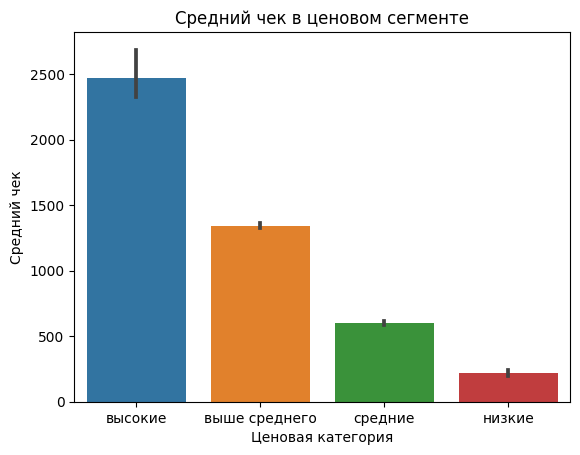

In [14]:
sns.barplot(x='price', y='middle_avg_bill', data=df.sort_values(by='middle_avg_bill', ascending=False))
plt.title('Средний чек в ценовом сегменте')
plt.xlabel('Ценовая категория')
plt.ylabel('Средний чек')
;

Что мы видим:
- низкая ценовая категория имеет средний чек до 300 руб.
- средняя - около 600 руб.
- выше среднего - примерно 1300 руб.
- высокая категория - чек в районе 2500 руб.


Так как мы необладаем достоверной и качественной информацией для заполнения пропусков, не будем этого делать, чтобы не исказить итоговые результаты и выводы.

### Выделение названий улиц с расположением заведений

In [15]:
#Продолжим предобработку - выделим названия улц из столбца с адресом
words = ['улица','ул','переулок','шоссе','проспект','площадь','проезд',
         'аллея','бульвар','набережная','тупик','линия', 'километр', 'просек']

str_pat = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(words))

df['street'] = df['address'].str.extract(str_pat, flags=re.I)
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,name_address,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,False,NaN,"wowфлимосква, улица дыбенко, 7/1",улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,False,4.0,"четыре комнатымосква, улица дыбенко, 36, корп. 1",улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,False,45.0,"хазримосква, клязьминская улица, 15",Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,False,NaN,"dormouse coffee shopмосква, улица маршала федо...",улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,True,148.0,"иль маркомосква, правобережная улица, 1б",Правобережная улица


In [16]:
#Проверим, сколько названий улиц нам удалось вычленить из адреса
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8402 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8402 non-null   object 
 1   category           8402 non-null   object 
 2   address            8402 non-null   object 
 3   district           8402 non-null   object 
 4   hours              7867 non-null   object 
 5   lat                8402 non-null   float64
 6   lng                8402 non-null   float64
 7   rating             8402 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8402 non-null   bool   
 13  seats              4792 non-null   float64
 14  name_address       8402 non-null   object 
 15  street             8247 non-null   object 
dtypes: bool(1), float64(6), 

In [17]:
#Видно, что недозаполненными осталось 155 улиц. Возможно, для этих заведений адрес указан не полностью. Проверим
#pd.set_option('display.max_rows', None)
df.query('street.isna()')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,name_address,street
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,True,NaN,"в парке вкуснеемосква, парк левобережный",NaN
60,Чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,True,NaN,"чебуречная историямосква, ландшафтный заказник...",NaN
64,Testo мания,кофейня,"Москва, Лианозовский парк культуры и отдыха",Северо-Восточный административный округ,"ежедневно, 09:00–21:00",55.900058,37.570544,4.1,NaN,NaN,NaN,NaN,False,NaN,"testo маниямосква, лианозовский парк культуры ...",NaN
73,Веранда,ресторан,"Москва, парк Алтуфьево",Северо-Восточный административный округ,"пн-пт 11:00–22:00; сб,вс 11:00–23:00",55.906875,37.582493,4.2,NaN,NaN,NaN,NaN,True,NaN,"верандамосква, парк алтуфьево",NaN
137,Get and fly,ресторан,"Москва, парк Ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880350,37.530713,4.1,NaN,NaN,NaN,NaN,False,NaN,"get and flyмосква, парк ангарские пруды",NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8303,Lavazza,пиццерия,"Москва, природно-исторический парк Кузьминки-Л...",Юго-Восточный административный округ,"ежедневно, 09:00–21:00",55.694765,37.769218,4.8,NaN,NaN,NaN,NaN,False,NaN,"lavazzaмосква, природно-исторический парк кузь...",NaN
8322,Кафе Лесное,пиццерия,"Москва, природно-исторический парк Кузьминки-Л...",Юго-Восточный административный округ,"пн-пт 11:00–22:00; сб,вс 10:00–23:00",55.695197,37.767559,4.8,NaN,NaN,NaN,NaN,False,NaN,"кафе лесноемосква, природно-исторический парк ...",NaN
8360,Сетевое кафе,кафе,"Москва, Юго-Восточный административный округ, ...",Юго-Восточный административный округ,"ежедневно, 10:00–23:00",55.693629,37.781027,3.3,NaN,NaN,NaN,NaN,False,NaN,"сетевое кафемосква, юго-восточный администрати...",NaN
8373,Те самые пончики,кафе,"Москва, природно-исторический парк Кузьминки-Л...",Юго-Восточный административный округ,"ежедневно, 10:00–21:00",55.695306,37.767886,4.8,NaN,NaN,NaN,NaN,False,NaN,"те самые пончикимосква, природно-исторический ...",NaN


Действительно, не для сех заведений указан конкретный адрес. Это особенность данных, восстановить информацию мы не сможем.

### Выделение круглосуточных заведений

In [18]:
#Добавим столбец с проверкой ежедневного и круглосуточного режима работы
df['is_24_7'] = df['hours'].str.contains('ежедневно, круглосуточно')
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,name_address,street,is_24_7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,False,NaN,"wowфлимосква, улица дыбенко, 7/1",улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,False,4.0,"четыре комнатымосква, улица дыбенко, 36, корп. 1",улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,False,45.0,"хазримосква, клязьминская улица, 15",Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,False,NaN,"dormouse coffee shopмосква, улица маршала федо...",улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,True,148.0,"иль маркомосква, правобережная улица, 1б",Правобережная улица,False


Таким образом, мы произвели необходимую предобработку исходного датасета:
- было выполнено изменение типа данных для столбца с принадлежностью заведения к сети: новый тип данных - булев;
- был выполнен поиск явных и неявных дубликатов: явных не было выявлено; неявных нашлось 4 - они были удалены;
- в данных есть пропуски, заполнить которые качественно не представляется возможности, поэтому пропуски были оставлены;
- дополнительно были выделены названия улиц заведений, а также определены круглосуточные заведения датасета.

## Анализ данных

### Категории заведений

In [19]:
#Выведем названия категорий, присутствующих в датасете
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [20]:
# готовим данные для графика
category = pd.DataFrame(df['category'].value_counts()).reset_index()
# строим диаграмму с сегментами
fig = go.Figure(data=[go.Pie(labels=category['index'], # указываем значения, которые появятся на метках сегментов
                             values=category['category'], # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Распределение заведений по категориям', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Тип заведения',
                                    showarrow=False)])
fig.show() # выводим график

### Количество посадочных мест по категориям

Text(0, 0.5, '')

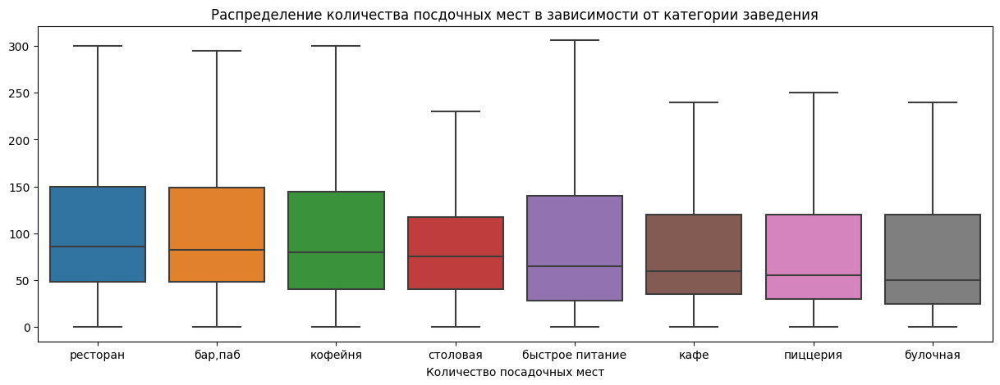

In [21]:
#Построим график "ящик с усами", чтобы визуализировать распределение по количества мест по видам заведений
plt.figure(figsize=(15, 5))
#Добавим переменную для сортировки
my_order = df.groupby(by=['category'])['seats'].median().sort_values(ascending=True).iloc[::-1].index
sns.boxplot(data=df, x='category', y='seats', showfliers=False, order = my_order)

#Ограничим ось у для наглядности и отсечения выбросов
plt.title('Распределение количества посдочных мест в зависимости от категории заведения')
plt.xlabel('Количество посадочных мест')
plt.ylabel(None)

#plt.ylim(0, 350)

Text(0, 0.5, '')

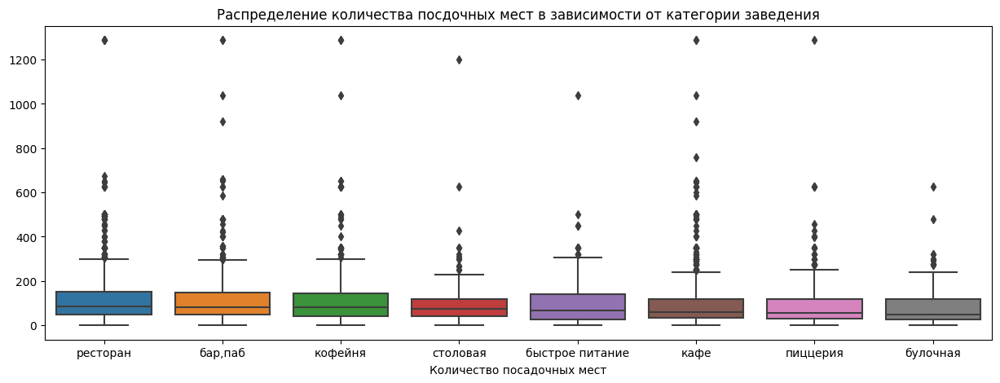

In [22]:
plt.figure(figsize=(15, 5))
sns.boxplot(data=df, x='category', y='seats', order = my_order)
#Ограничим ось у для наглядности и отсечения выбросов
plt.title('Распределение количества посдочных мест в зависимости от категории заведения')
plt.xlabel('Количество посадочных мест')
plt.ylabel(None)
#plt.ylim(0, 350)

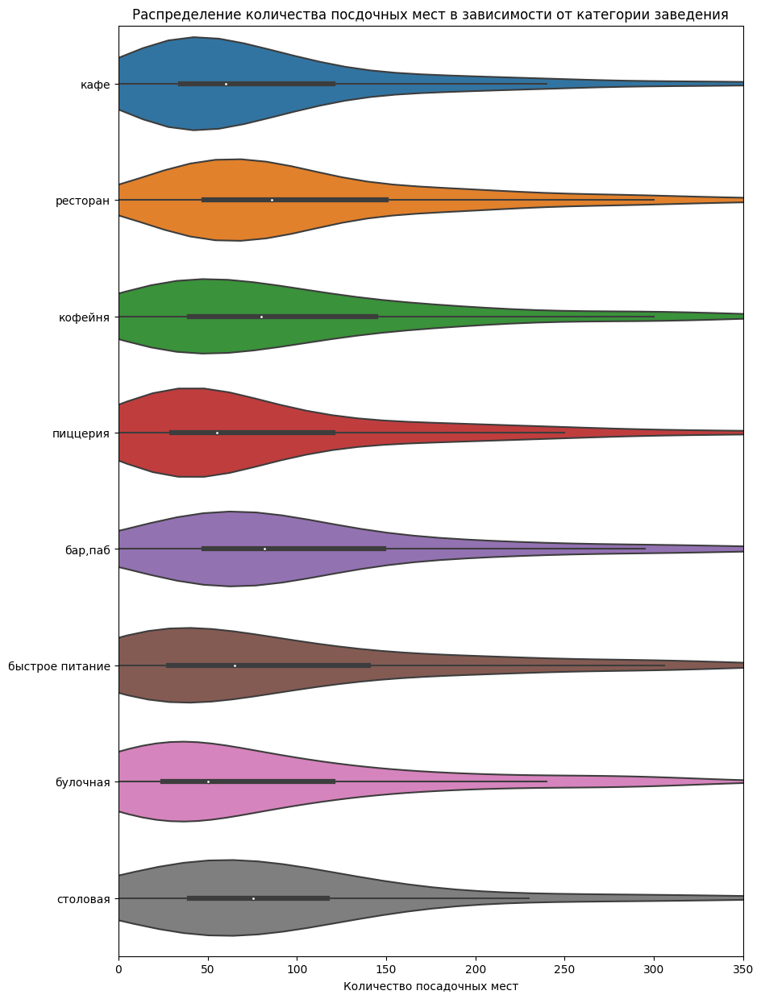

In [23]:
#Задаем размеры графика
plt.figure(figsize=(10, 15))
# строим график violinplot средствами seaborn
sns.violinplot(x='seats', y='category', data=df)
# ограничиваем ось X для наглядности
plt.xlim(0, 350)
# указываем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение количества посдочных мест в зависимости от категории заведения')
plt.xlabel('Количество посадочных мест')
plt.ylabel(None)
# отображаем график на экране
plt.show()

Видно, что если оценивать количество посадочных мест по медианному значению, наиболее вместительными являются рестораны, кофейни, а также бары/пабы - они вмещают около 80 гостей. Максимумы на графике с вместимостью до 300 гостей - вероятнее всего означают заведения, расположеные на фудкортах в ТЦ. Ну а выбросы в районе 1250 мест точно обозначают не сидячие места, а, возможно, полную вместимость заведений.

### Соотношение сетевых и несетевых заведений

In [24]:
# готовим данные для графика
chain = pd.DataFrame(df['chain'].value_counts()).reset_index()

#Корректируем подиси в легенде
labels = {False:'несетевые', True:'сетевые'}
chain['index'] = chain['index'].map(labels)

# строим диаграмму с сегментами
fig = go.Figure(data=[go.Pie(labels=chain['index'], # указываем значения, которые появятся на метках сегментов
                             values=chain['chain'], # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Соотношение сетевых и несетевых заведений', # указываем заголовок графика
                  width=500, # указываем размеры графика
                  height=400, 
                  annotations=[dict(x=1.10, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Тип заведения', 
                                    showarrow=False)])


fig.show() # выводим график

По круговой диаграмме видно, что несетевых заведений в наших данных преимущественное большинство - почти 62%.

### Соотношение сетевых и несетевых заведений в разрезе категорий

In [25]:
#Завернем в функцию код из предыдущего задания, чтобы выстроить pie-чарты для каждой категории заведений
def pie_category(type):
    # готовим данные для графика
    chain = pd.DataFrame(df.query('category == @type')['chain'].value_counts()).reset_index()

    #Корректируем подиси в легенде
    labels = {False:'несетевые', True:'сетевые'}
    chain['index'] = chain['index'].map(labels)

    # строим диаграмму с сегментами
    fig = go.Figure(data=[go.Pie(labels=chain['index'], # указываем значения, которые появятся на метках сегментов
                                 values=chain['chain'], # указываем данные, которые отобразятся на графике
                                 pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
    fig.update_layout(title=f'Соотношение сетевых и несетевых заведений для категории {type}', # указываем заголовок графика
                      width=800, # указываем размеры графика
                      height=400, 
                      annotations=[dict(x=1.10, # вручную настраиваем аннотацию легенды
                                        y=1.05,
                                        text='Тип заведения', 
                                        showarrow=False)])


    fig.show() # выводим график

In [26]:
#Применим функцию к списку всех категорий заведений
type_category = df['category'].unique()
for t in type_category:
    pie_category(t)

Видно, что для всех категорий заведений преобладают несетевые типы. Больше всего несетевых заведений в категориях бар/паб и столовая - на их долю среди своей категории приходится более 70%. При этом именно сетевых заведений больше всего в категориях пиццерии и кафе - доля сетевых заведений доходит почти до 50% внутри этих категорий.

In [27]:
#Готовим данные для визуализации
chain_category = df.pivot_table(index = 'category', values = 'chain', aggfunc = 'sum')
chain_category.reset_index(inplace = True)
chain_category
category = category.rename(columns={'category': 'total'})
category = category.rename(columns={'index': 'category'})
chain_category = chain_category.merge(category, on = 'category', how = 'left')
chain_category['no_chain'] = chain_category['total'] - chain_category['chain']
chain_category['per_chain'] = (chain_category['chain']/chain_category['total'] *100).round()
chain_category['per_no_chain'] = (chain_category['no_chain']/chain_category['total'] *100).round()

In [28]:
#Строим столбчатую диаграмму
fig = go.Figure(data=[
    go.Bar(name='сетевые', x=chain_category['category'], y=chain_category['chain'], text = chain_category['per_chain']),
    go.Bar(name='не сетевые', x=chain_category['category'], y=chain_category['no_chain'], text = chain_category['per_no_chain'])
])

fig.update_layout(barmode='group')
fig.update_xaxes(categoryorder='total descending')
fig.update_layout(title='Распределение сетеых и несетевых заведений по категориям',
                   xaxis_title='Категории',
                   yaxis_title='Количество')
fig.show()

Видно, что для категорий кафе, ресторан, бар/паб, быстрое питание и столовые - преобладают не сетевые заведения.
Среди булочных больше именно сетевых заведений. В пиццериях и кофейнях относительный паритет сетевых и несетевых заведений.

### ТОП-15 сетей Москвы

In [29]:
#Сгруппируем сети по названию, подсчитав частоту упоминаний в датасете
top=df.query('chain == True')\
    .pivot_table(index = 'name', values = 'category', aggfunc = 'count')\
    .reset_index().rename(columns={'category':'count'})\
    .sort_values(by = 'count', ascending = False).head(15)
#Подтянем к своднику категории заведений
top = top.merge(df[['name','category']], on = 'name', how = 'left')#.drop_duplicates()
top=top.rename(columns={'count':'total'})
top_new=top.pivot_table(index = ['name', 'category'], values = 'total', aggfunc = 'count')
top_new = top_new.reset_index()
top_new = top_new.rename(columns={'total':'count'})
top_new = top_new.merge(top[['name', 'total']], on = 'name', how = 'left')
top_new=top_new.drop_duplicates()
top_new

,name,category,count,total
0,CofeFest,кафе,1,32
32,CofeFest,кофейня,31,32
64,Cofix,кофейня,65,65
129,One Price Coffee,кофейня,71,71
200,Prime,кафе,1,50
250,Prime,ресторан,49,50
300,Буханка,булочная,25,32
332,Буханка,кафе,1,32
364,Буханка,кофейня,6,32
396,Додо Пицца,пиццерия,74,74


Видно, что некоторым наименованиям соответствуют разные категории.

In [30]:
#Строим визуализацию
fig = px.bar(top_new, x='name', y='count', color='category', title='Топ15 заведений Москвы в разрезе категорий')

fig.update_xaxes(tickangle=45)
fig.update_xaxes(title_text='Названия') # подпись для оси X
fig.update_yaxes(title_text='Количество') # подпись для оси Y
fig.update_xaxes(categoryorder='total descending')
fig.show() 

В топ-3 заведений Москвы по количеству открытых точек входит кофейня Шоколадница и 2 пиццерии - Доминос и Додо.
Часть заведений из Топ-15 имеет разные категории: так, например, Хинкальная - это и кафе, и ресторан, и бар/паб, и быстрое питание.

In [31]:
#Сгенерируем дополнительный столбец с названием заведения и его категорией
df['name_category'] = df['name'] + '_' + df['category']
#Проведем аналогичную прошлому этапу группировку данных, но уже с "приземлением" на новый столбец
top_define=df.query('chain == True')\
    .pivot_table(index = 'name_category', values = 'category', aggfunc = 'count')\
    .reset_index().rename(columns={'category':'count'})\
    .sort_values(by = 'count', ascending = False).head(15)
top_define

,name_category,count
1142,Шоколадница_кофейня,119
504,Домино'с Пицца_пиццерия,76
497,Додо Пицца_пиццерия,74
206,One Price Coffee_кофейня,71
1158,Яндекс Лавка_ресторан,69
73,Cofix_кофейня,65
242,Prime_ресторан,49
558,КОФЕПОРТ_кофейня,42
644,Кулинарная лавка братьев Караваевых_кафе,39
978,Теремок_ресторан,36


Итак сравнивая две таблицы, можно убедиться, что в датасете есть знаменитая сетка кофеен Шоколадница, а также единичное одноименное кафе, не имеющее к сетке отношения. Так же история с сетевым рестораном Prime и одноименным единичным кафе. Таким образом мы исбавились от заведений, где ошибочно проставлен признак сети и можем строить визуализацию.

In [32]:
#Для визуализации нам потребуется названия и категория заведения по-отдельности. Добавим информацию
top_define = top_define.merge(df[['name','category', 'name_category']], on = 'name_category', how = 'left').drop_duplicates()
top_define

,name_category,count,name,category
0,Шоколадница_кофейня,119,Шоколадница,кофейня
119,Домино'с Пицца_пиццерия,76,Домино'с Пицца,пиццерия
195,Додо Пицца_пиццерия,74,Додо Пицца,пиццерия
269,One Price Coffee_кофейня,71,One Price Coffee,кофейня
340,Яндекс Лавка_ресторан,69,Яндекс Лавка,ресторан
409,Cofix_кофейня,65,Cofix,кофейня
474,Prime_ресторан,49,Prime,ресторан
523,КОФЕПОРТ_кофейня,42,КОФЕПОРТ,кофейня
565,Кулинарная лавка братьев Караваевых_кафе,39,Кулинарная лавка братьев Караваевых,кафе
604,Теремок_ресторан,36,Теремок,ресторан


In [33]:
#Строим визуализацию
fig = px.bar(top_define, x='name', y='count', color='category', title='Топ15 заведений Москвы в разрезе категорий')

fig.update_xaxes(tickangle=45)
fig.update_xaxes(title_text='Названия') # подпись для оси X
fig.update_yaxes(title_text='Количество') # подпись для оси Y

fig.show() 

Мы видим, что наиболее популярные категории заведений - это кафейни, пиццерии, рестораны, кафе и даже есть одна сетевая булочная. При этом внутри данных категорий есть свои лидеры - среди кофеен - это Шоколадница; среди ресторанов - Яндекс.Лавка, срели кафе - Кулинарная лавка братьев Караваевых.
Характерно, что среди пиццерий выделено 2 крупных игрока - Доминос и Додо.
Предполагаю, что в таком окружении будет довольно тяжело конкурировать, создавая единичное (несетевое) заведение. Поэтому пока я склоняюсь к гипотезе, что наиболее оптимальным решением для инвестиционного вложения будет войти в одну из популярных сетей по франшизе - остается только определиться с категорией заведения и его расположением.

### Расположение заведений

In [34]:
#Составим сводную таблицу по районам и подсчитаем количество заведений
dist = df.pivot_table(index = 'district', values = 'name', aggfunc = 'count')
dist.reset_index(inplace = True)
dist=dist.rename(columns={'name':'total'})
dist

,district,total
0,Восточный административный округ,798
1,Западный административный округ,850
2,Северный административный округ,898
3,Северо-Восточный административный округ,890
4,Северо-Западный административный округ,409
5,Центральный административный округ,2242
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
8,Южный административный округ,892


In [35]:
# строим столбчатую диаграмму 
fig = px.bar(dist.sort_values(by='total', ascending = False), # загружаем данные и заново их сортируем
             x='district', # указываем столбец с данными для оси X
             y='total', # указываем столбец с данными для оси Y
             text='total' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Распределение количества заведений по районам',
                   xaxis_title='Районы',
                   yaxis_title='Количество заведений')
fig.show() # выводим график

In [36]:
#Добавим еще один параметр для агрегирования - категорию заведения

dist_cat = df.pivot_table(index = ['district', 'category'], values = 'name', aggfunc = 'count')
dist_cat.reset_index(inplace = True)
#Добавим общее количество заведений в районе
dist_cat = dist_cat.merge(dist, on= 'district', how = 'left')
dist_cat = dist_cat.sort_values(by = 'total', ascending = False)
#Высчитаем процент каждой категории в районе
dist_cat['percent']=(dist_cat['name']/dist_cat['total']*100).round(0)
#pd.set_option('display.max_rows', None)
dist_cat

,district,category,name,total,percent
41,Центральный административный округ,булочная,50,2242,2.0
42,Центральный административный округ,быстрое питание,87,2242,4.0
43,Центральный административный округ,кафе,464,2242,21.0
44,Центральный административный округ,кофейня,428,2242,19.0
45,Центральный административный округ,пиццерия,113,2242,5.0
...,...,...,...,...,...
33,Северо-Западный административный округ,булочная,12,409,3.0
34,Северо-Западный административный округ,быстрое питание,30,409,7.0
35,Северо-Западный административный округ,кафе,115,409,28.0
37,Северо-Западный административный округ,пиццерия,40,409,10.0


In [37]:
# строим столбчатую диаграмму 
fig = px.bar(dist_cat, # загружаем данные и заново их сортируем
             x='district', # указываем столбец с данными для оси X
             y='name', # указываем столбец с данными для оси Y
             color = 'category',
             barmode = 'stack',
             text='percent' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Распределение количества заведений по районам',
                   xaxis_title='Районы',
                   yaxis_title='Количество заведений')
fig.show() # выводим график

На графике видно, что больше всего заведений находится в ЦАО - более 2 тыс.; меньше всего - в СЗАО - около 400. В ЦАО больше всего пабов/баров по отношению к другим районам. Кроме того в центре много ресторанов - их удельный вес в общем количестве заведений общепита - 30%. В абсолютном выражении количество кафе в ЦАО также максимально по отношению к количеству кафе в других районах, однако среди общего количества заведений их удельный вес небольшой - около 19%, в то время, как в других районах удельный вес количества кафе доходит до 39%, как в ЮВАО.
Примечательно, что пиццерии и зведения общественного питания расположены практически равномерно по всей Москве.
Самые малочисленные категории заведений по всей Москве - это булочные. Я связываю это с тем, что булочные и пекарни - это скорее категория розничной торговли продуктами питания, нежели общепит. 

### Рейтинги заведений

In [38]:
#Составим сводную таблицу среднего рейтинга заведений в разрезе категорий
rating = df.pivot_table(index = 'category', values = 'rating', aggfunc = 'mean')
rating.reset_index()

,category,rating
0,"бар,паб",4.387696
1,булочная,4.268359
2,быстрое питание,4.050249
3,кафе,4.124285
4,кофейня,4.277282
5,пиццерия,4.301264
6,ресторан,4.290402
7,столовая,4.211429


In [39]:
# строим столбчатую диаграмму 
fig = px.bar(rating.sort_values(by = 'rating', ascending = False), # загружаем данные и заново их сортируем
             x=rating.index, # указываем столбец с данными для оси X
             y='rating', # указываем столбец с данными для оси Y
             
             #text='total_count' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Средний рейтинг',
                   xaxis_title='Категории заведений',
                   yaxis_title='Средний рейтинг категории',
                 yaxis=dict(range=[4,4.4]))


fig.show() # выводим график

Видно, что средние рейтинги немного колеблются в зависимости от категории заведения. Самые низкие рейтинги у столовых - 4 балла. Самые высокие - в барах/пабах почти 4,4 балла. Для булочных, заведений быстрого питания, кафе и кофеен рейтинг примерно на одном уровне - 4,3 балла.

### Фоновая картограмма среднего рейтинга заведений

In [40]:
#Составим сводную таблицу средних рейтингов заведений по районам
rating_dist = df.pivot_table(index = 'district', values = 'rating', aggfunc = 'mean')
rating_dist.reset_index(inplace = True)
rating_dist.sort_values(by='rating', ascending = False)

,district,rating
5,Центральный административный округ,4.377520
2,Северный административный округ,4.240980
4,Северо-Западный административный округ,4.208802
8,Южный административный округ,4.184417
1,Западный административный округ,4.181647
0,Восточный административный округ,4.174185
7,Юго-Западный административный округ,4.172920
3,Северо-Восточный административный округ,4.147978
6,Юго-Восточный административный округ,4.101120


In [44]:
# загружаем JSON-файл с границами округов Москвы
state_geo = open('/content/admin_level_geomap.geojson', 'r', encoding='utf-8-sig').read()
#state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_dist,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.3,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

На хороплете видно, что самый высокий средний рейтинг у заведений в ЦАО, за ним следует САО. Самый низкий рейтинг заведений в ЮВАО.

### Кластеры заведений на карте

In [45]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

### ТОП-15 улиц по количеству заведений

In [46]:
#Составим топ-15 улиц по количеству заведений
top_street_total = df.pivot_table(index = 'street', values = 'name', aggfunc = 'count')
top_street_total.reset_index(inplace = True)
top_street_total=top_street_total.rename(columns={'name' : 'total'})
top_street_total=top_street_total.sort_values(by='total', ascending = False).head(15)
top_street_total

,street,total
1046,проспект Мира,183
773,Профсоюзная улица,122
1043,проспект Вернадского,108
530,Ленинский проспект,107
528,Ленинградский проспект,95
382,Дмитровское шоссе,88
463,Каширское шоссе,77
313,Варшавское шоссе,75
529,Ленинградское шоссе,69
549,Люблинская улица,60


In [47]:
#Составим аналогичный предыдущему сводник в разрезе категорий
top_street_category=df.pivot_table(index = ['street', 'category'], values = 'name', aggfunc = 'count')
top_street_category.reset_index(inplace = True)
top_street_category=top_street_category.rename(columns={'name' : 'count_category'})
top_street_category

,street,category,count_category
0,1-й Автозаводский проезд,кафе,1
1,1-й Балтийский переулок,ресторан,1
2,1-й Варшавский проезд,кафе,1
3,1-й Вешняковский проезд,кафе,1
4,1-й Волоколамский проезд,кафе,1
...,...,...,...
3741,шоссе Энтузиастов,быстрое питание,4
3742,шоссе Энтузиастов,кафе,10
3743,шоссе Энтузиастов,кофейня,7
3744,шоссе Энтузиастов,пиццерия,2


In [48]:
#Объединим сводные таблицы для дальнейшей визуализации
top_street_total = top_street_total.merge(top_street_category, on = 'street', how = 'inner')
#pd.set_option('display.max_rows', None)
top_street_total['percent'] = (top_street_total['count_category']/top_street_total['total']*100).round(0)
top_street_total

,street,total,category,count_category,percent
0,проспект Мира,183,"бар,паб",11,6.0
1,проспект Мира,183,булочная,4,2.0
2,проспект Мира,183,быстрое питание,21,11.0
3,проспект Мира,183,кафе,53,29.0
4,проспект Мира,183,кофейня,36,20.0
...,...,...,...,...,...
108,Алтуфьевское шоссе,47,кафе,13,28.0
109,Алтуфьевское шоссе,47,кофейня,9,19.0
110,Алтуфьевское шоссе,47,пиццерия,3,6.0
111,Алтуфьевское шоссе,47,ресторан,10,21.0


In [49]:
# строим столбчатую диаграмму 
fig = px.bar(top_street_total, # загружаем данные и заново их сортируем
             x='street', # указываем столбец с данными для оси X
             y='count_category', # указываем столбец с данными для оси Y
             color = 'category',
             barmode = 'stack',
             text='percent' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Распределение количества заведений по улицам, %',
                   xaxis_title='Улицы',
                   yaxis_title='Количество заведений')
fig.show() # выводим график

Видно, что самая концентрировнная улица по количеству заведений общепита - проспект Мира. В основном там находятся кафе и рестораны - 29% и 25% соответственно. Вероятнее всего, именно эту улицу можно назвать самой проходимой с точки зрения человекопотока, отсюда такая конкуренция.

### Улицы с одним объектом общепита

In [50]:
#Составим список улиц с одним объектом общепита
one_name_street = df.pivot_table(index = 'street', values = 'name', aggfunc = 'count')
one_name_street.reset_index(inplace = True)
one_name_street=one_name_street.rename(columns={'name' : 'total'})
one_name_street=one_name_street.query('total == 1')
one_name_street

,street,total
0,1-й Автозаводский проезд,1
1,1-й Балтийский переулок,1
2,1-й Варшавский проезд,1
3,1-й Вешняковский проезд,1
5,1-й Голутвинский переулок,1
...,...,...
1390,улица Чечулина,1
1391,улица Чистова,1
1394,улица Шкулёва,1
1396,улица Шухова,1


In [51]:
#Зафильтруем исходный датасет
df_one_street = df.merge(one_name_street, on = 'street', how = 'right')
#Составим сводную таблицу по категориям заведений
df_one_street_category=df_one_street.pivot_table(index = 'category', values = 'name', aggfunc = 'count')
df_one_street_category.reset_index(inplace = True)
df_one_street_category.sort_values(by = 'name', ascending = False)

,category,name
3,кафе,147
6,ресторан,88
4,кофейня,77
0,"бар,паб",40
7,столовая,36
2,быстрое питание,18
5,пиццерия,14
1,булочная,9


In [52]:
# строим столбчатую диаграмму 
fig = px.bar(df_one_street_category.sort_values(by='name', ascending=True), # загружаем данные и заново их сортируем
             x='name', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='name' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Категории заведений, которые расположены на улицах с единственным объектом общепита',
                   xaxis_title='Количество заведений',
                   yaxis_title='Категории')
fig.show() # выводим график

In [53]:
#Составим сводную таблицу по районам расположения
df_one_street_district=df_one_street.pivot_table(index = 'district', values = 'name', aggfunc = 'count')
df_one_street_district.reset_index(inplace = True)
df_one_street_district.sort_values(by = 'name', ascending = False)

,district,name
5,Центральный административный округ,135
0,Восточный административный округ,54
3,Северо-Восточный административный округ,49
2,Северный административный округ,48
1,Западный административный округ,37
8,Южный административный округ,37
6,Юго-Восточный административный округ,33
4,Северо-Западный административный округ,19
7,Юго-Западный административный округ,17


In [54]:
#Отрисуем расположение заведений, чтобы оценить визуальный разброс

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['address']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df_one_street.apply(create_clusters, axis=1)

# выводим карту
m

In [55]:
# строим столбчатую диаграмму 
fig = px.bar(df_one_street_district.sort_values(by='name', ascending=True), # загружаем данные и заново их сортируем
             x='name', # указываем столбец с данными для оси X
             y='district', # указываем столбец с данными для оси Y
             text='name' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Районы расположения заведений, которые находятся на улицах с единственным объектом общепита',
                   xaxis_title='Количество заведений',
                   yaxis_title='Районы')
fig.show() # выводим график

Видно, что в центре очень много кафе, которые являются единственным объектом общепита на улице расположения. Если рассуждать в парадигме, что эти улицы должны быть потенциально интересны для размещения нового объекта общепита в связи с минимальной конкуренцией, то это ошибочная теория. На карте прекрасно видно, что фактически рассматриваемая категория заведений высоко сконцентрирована в самом центре столицы. И связано это, скорее всего, с протяженностью улиц - в центре много коротких улиц и все "единичные" кафе по сути находятся поблизости друг с другом.

### Зависимость среднего чека заведения от района расположения

In [56]:
#Составим сводную таблицу медианных чеков от района расположения заведения
df_median_price = df.pivot_table(index = 'district', values = 'middle_avg_bill', aggfunc = 'median')
df_median_price.reset_index(inplace = True)
df_median_price

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [57]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=df_median_price,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.4,
    legend_name='Медианный чек заведений по районам',
).add_to(m)

# выводим карту
m

Видно, что разница в среднем чеке в центре и других районах может доходить до 2 раз. Соответственно, чем ближе к центру - тем выше средний чек. Вероятно, это и логично - в центре выше аренда помещений, соответственно данные расходы вложены в цену для конечных покупателей.

### Вывод

Мы провели анализ данных заведений общественного питания в Москве.

С точки зрения качества исходных данных, можно отметитьследующее:
- датсет заполнен не полностью. Например, ключевые метрики для оценки инвестиционной привлекательности со средним чеком заведения или количеством посадочных мест представлены не в полном объеме. Кроме того, есть пропуски в данных с полным адресом заведения, а также режимом работы.
- в датасете представлены одноименные сетевые заведения, относящиеся к разным категориям. Так, например, Хинкальная (сеть заведений, входящая в топ-10 по количеству открытыхх точек) - это и кафе, и ресторан, и бар/паб, и быстрое питание.
- Кроме того, есть особенности, связанные категоризацией заведений. Так, например, известная сеть "Теремок" в датасете относится к категории ресторанов, хотя это, скорее всего, быстрое питание. Или "Яндекс Лавка" - это сервис доставки, а не самостоятельный ресторан, как это указано в датасете.
- для некоторых заведений обнаружены выбросы в данных о количестве посадочных мест. Вполне вероятно, что аномалии связны с тем, что часть заведений расположена на фудкортах в ТЦ, где действительно много посадочных мест и их разделяет сразу несколько точек общепита. Либо заведение указало не посадочные места, а общую вместимость (например для заведений при гостиницах).

Основные тезисы смыслового контента датасета:
- более 50% заведений в Москве относятся к категориям кафе и рестораны - на их долю приходится соответственно 28% и 24% от общего количества заведений. На третьем месте по количеству заведений аходятся кофейни - их почти 17%. Самая малочисленная категория заведений - это булочные, на их долю приходится около 3%. Не уверена, что булочные можно считать полноценной категорией общепита, т.к. это скорее всего относится к розничной торговле продуктами питания, поэтому возможно данные тут несколько занижены.
- по имеющимся данным все категории заведений имеют примерно одинаковое количество посадочных мест в диапазоне от 30 до 150. Если оценивать вместимость по медианному значению, наиболее емкими являются рестораны, кофейни, а также бары/пабы - они вмещают около 80 гостей.
- большинство заведений - почти 62% - относятся к несетевым заведениям. Если рассматривать разбивку внутри категорий заведений, видно, что для категорий кафе, ресторан, бар/паб, быстрое питание и столовые - преобладают не сетевые заведения. Среди булочных больше именно сетевых заведений. В пиццериях и кофейнях относительный паритет сетевых и несетевых заведений.
- в топ-3 заведений Москвы по количеству открытых точек входит кофейня Шоколадница (120 точек) и 2 пиццерии - Доминос (76 точек) и Додо (74). Видно, что сети стремятся к определенной плотности покрытия всех районов для занятия своей доли на рынке.
- с точки зрения концентрации заведений по районам Москвы видно, на сколько сильно выбивается ЦАО - заведений в центре больше, чем в любом другой районе больше примерно в 2 раза, хотя сам район не сильно больше других по площади. Категория заведений в цАО также имеет свои особенности - там больше всего ресторанов и баров/пабов, в то время, как в других районах их удельный вес не так велик. Для остальных районов более распространены кафе. Если рассматривать именно кофейни, как целевой сегмент для инвестиций, то хочется отметить, что это не самая распространенная категория во всех районах - есть более более плотно конкурирующие категории заведений. Возможно менее напряженная конкурентия внутри категории сможет показать целевой инвесиционный результат.
- при оценке рейтингов заведений видно, что средние рейтинги немного колеблются в зависимости от категории заведения. Самые низкие рейтинги у столовых - 4 балла. Самые высокие - в барах/пабах почти 4,4 балла, которые, кстати, в основном базируются в центре. Для булочных, заведений быстрого питания, кафе и кофеен рейтинг примерно на одном уровне - 4,3 балла.
- если оценивать географическую привязку рейтингов, видно что самый высокий средний рейтинг у заведений в ЦАО, за ним следует САО. Самый низкий рейтинг заведений в ЮВАО. Высокие оценки в центр вполне логичны - ведь там больше всего зведений.
- в исходных данных выделяется ряд улиц, на которых расположено больше всего заведений общепита - вероятнее всего именно по этим улицам проходит плотный человекопоток, отсюда такая жесткая конкуренция. Видно, что самая концентрировнная улица по количеству заведений общепита - проспект Мира - на ней находятся 183 точки. В основном это кафе и рестораны - 29% и 25% соответственно. 
- также в исходных данных есть ряд улиц, где расположен всего один объект общепита. Так, например, в центре очень много кафе, которые являются единственным объектом общепита на улице расположения. Если рассуждать в парадигме, что эти улицы должны быть потенциально интересны для размещения нового объекта общепита в связи с минимальной конкуренцией, то это ошибочная теория. На карте прекрасно видно, что фактически рассматриваемая категория заведений высоко сконцентрирована в самом центре столицы. И связано это, скорее всего, с протяженностью улиц - в центре много коротких улиц и все "единичные" кафе по сути находятся поблизости друг с другом.
- если продолжить говорить о ЦАО, как о центре ресторанной жизни столицы видно, что и средний чек заведений там соответствующий. Видно, что разница в среднем чеке в центре и других районах может доходить до 2 раз. Соответственно, чем ближе к центру - тем выше средний чек. Вероятно, это и логично - в центре выше аренда помещений, соответственно данные расходы вложены в цену для конечных покупателей.

## Открытие кофейни

Из п. 3.1 мы знаем, что в датасете всего 1413 кофеен, что составляет 16,8% от общего количества заведений.

### Районы

In [58]:
#Выведем районы расположения кофеен
coffe_house=df.query('category == "кофейня"')
coffe_house_dist=coffe_house.pivot_table(index = 'district', values = 'name', aggfunc = 'count')
coffe_house_dist.reset_index(inplace = True)
coffe_house_dist.sort_values(by = 'name', ascending = False)

,district,name
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


In [59]:
# строим столбчатую диаграмму 
fig = px.bar(coffe_house_dist.sort_values(by='name', ascending=True), # загружаем данные и заново их сортируем
             x='name', # указываем столбец с данными для оси X
             y='district', # указываем столбец с данными для оси Y
             text='name' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Районы расположения кофеен',
                   xaxis_title='Количество заведений',
                   yaxis_title='Районы')
fig.show() # выводим график

In [60]:
#Отрисуем расположение заведений, чтобы оценить визуальный разброс

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffe_house.apply(create_clusters, axis=1)

# выводим карту
m

Видно, что заведения в центральном районе расположены довольно плотно, в ЦАО находится 498 кофеен, что оставляет более 30% всех заведений этой категории. В такой конкурентной среде довольно сложно будет запускать что-то новое. Успешным запуск может быть в том случае, если:
- расположение точки будет проходным (по пути в метро, с удобной парковкой)
- новое заведение будет известным, раскрученным (например из популярной сети)
- новое заведение будет расположено рядом с низкорейтинговыми кофейнями
- затраты на открытие будут окупаемы в краткосрочной перспективе

### Режим работы

In [61]:
#Найдем количество круглосуточных кофеен
coffe_house['is_24_7'].sum()

59

Из всего перчня кофеен в круглосуточном режиме работают только 59 - это менее 5%. Вероятно, это не очень рентабельно - содержать несколько смен сотрудников для обеспечения бесперебойной работы. 

### Рейтинг

In [62]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffe_house.apply(create_clusters, axis=1)


Choropleth(
    geo_data=state_geo,
    data=coffe_house,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Reds',
    fill_opacity=0.3,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m)


# выводим карту
m

В центре не самые высокие рейтинги заведений. Можно предположить, что аудитория требует довольно высокий сервис в связи с плотной конкуренцией. А заведения, вероятно, не всегда могут поддерживать требуемый уровень. В ВАО и СВАО рейтинги кофеен самые высокие по всей Москве - заведени там в разы меньше, чем в ЦАО, но конкуренция, видимо, жесткая - заведения стараются поддерживать клиентские рейтинги (если этим данным, конечно, можно доверять =) Все-таки рейтинг - довольно субъективная оценка, которую, к тому же, можно "накрутить"). Хуже всего оцениваются кофейни в ЗАО, ЮАО и САО.

### Стоимость чашки капучино

In [63]:
print('Средняя стоимость чашки кофе',df.query('category == "кофейня"')['middle_coffee_cup'].mean().round(),'рублей')

Средняя стоимость чашки кофе 175.0 рублей


In [64]:
#Найдем, сколько пропусков в столбце с информаций о стоимости чашки капучино
coffe_house.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1413 entries, 3 to 8400
Data columns (total 18 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1413 non-null   object 
 1   category           1413 non-null   object 
 2   address            1413 non-null   object 
 3   district           1413 non-null   object 
 4   hours              1398 non-null   object 
 5   lat                1413 non-null   float64
 6   lng                1413 non-null   float64
 7   rating             1413 non-null   float64
 8   price              476 non-null    object 
 9   avg_bill           721 non-null    object 
 10  middle_avg_bill    200 non-null    float64
 11  middle_coffee_cup  521 non-null    float64
 12  chain              1413 non-null   bool   
 13  seats              751 non-null    float64
 14  name_address       1413 non-null   object 
 15  street             1383 non-null   object 
 16  is_24_7            1398 

По имеющимся данным средняя стоимость чашки кофе 175 руб. Однако, в связи с органиченностью исходных данных, данное значение нельзя принимать в качестве ориентира, т.к. оно описывает только 30% кофеен из всего датасета. Тем более, капучино - не единственный продаваемый товар, и, на сколько мне известно, комплиментарные (дополнительные) товары, дают осноовную маржу заведениям.
При дальнейшем ценообразовании я бы ориентировалась не на "среднее по больнице", а на 3 ключевые метрики:
- уровень затрат на производство единицы товара 
- минимально необходимая маржа для стремления к точке безубыточности
- уровень цен на аналогичные товары у ближайших по территории конкурентов

В целом, если в бизнес-модель закладывается концепция заведения как "крутая и доступная, как «Central Perk»", возможно можно было рассчитать меню таким образом, чтобы определенный вид кофе был бы бесплатным при выборе десерта/ланча/добавок или заказа по меню на определенную сумму.

### Соотношение сетевых и несетевых кофеен

In [65]:
# готовим данные для графика
chain_coffe_house = pd.DataFrame(coffe_house['chain'].value_counts()).reset_index()

#Корректируем подиси в легенде
labels = {False:'несетевые', True:'сетевые'}
chain_coffe_house['index'] = chain_coffe_house['index'].map(labels)

# строим диаграмму с сегментами
fig = go.Figure(data=[go.Pie(labels=chain_coffe_house['index'], # указываем значения, которые появятся на метках сегментов
                             values=chain_coffe_house['chain'], # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Соотношение сетевых и несетевых кофеен', # указываем заголовок графика
                  width=500, # указываем размеры графика
                  height=400, 
                  annotations=[dict(x=1.10, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Тип заведения', 
                                    showarrow=False)])


fig.show() # выводим график

Видно, что в сегменте кофеен сетевые и несетевые заведения распределяются 50/50. По моему субъективному мнению продвигать сетевую кофейню легче, т.к. 
- меню привычно покупателям, есть любимые блюда и напитки
- бренд узнаваем, выступает "гарантом" качества

In [66]:
#Топ-5 кофеен по количеству точек
coffe_house_top_chain=coffe_house.query('chain == True').pivot_table(index = 'name', values = 'category', aggfunc = 'count')
coffe_house_top_chain.reset_index(inplace = True)
coffe_house_top_chain = coffe_house_top_chain.sort_values(by='category', ascending=False).head(5)
coffe_house_top_chain

,name,category
157,Шоколадница,119
59,One Price Coffee,71
32,Cofix,65
102,КОФЕПОРТ,42
13,CofeFest,31


In [67]:
#Подготовим датасет для визуализации сети "Шоколадница"
Shokoladnica = coffe_house.query('name == "Шоколадница"')

In [68]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
Shokoladnica.apply(create_clusters, axis=1)

# выводим карту
m

### Вывод

Для определения инвестиционной привлекательности любого бизнеса, в том числе открытия кофейни, необходимы данные о затратной и доходной частях: можно было бы прикинуть денежные потоки, рассчитать срок окупаемости вложений и сопоставить его с ожиданиями инвесторов. 

У нас нет данных о степени и качестве "проходимости" тех или иных мест - заведение может быть в самом центре в самом проходимом месте, но не пользоваться спросом среди посетителей - т.к. не было сопоставления потенциальной целевой аудитории заведения и его концепции (поясню: в ЦУМ не поставишь автомат с дешевым кофе - он не будет приносить никакой прибыли из-за несовпадения проходящей аудитории и формата "заведения"). 

У нас нет данных о том, на сколько успешно идут дела у потенциальных конкурентов - возможно из-за высокой плотности заведений общепита производственные мощности загружены не полностью и собственники едва покрывают расходы. А может быть наоброт - человекопоток на столько большой, что спрос остается неудовлетворенным, что рождает новые и новые точки общепита.
Так или иначе, по имеющейся информации мы сможем сделать только ознакомительные выводы о конкурентном окружении. Поэтому дать квалифицированную рекомендацию открывать или не открывать заведение в том или ином районе или той или иной категории, пожалуй, невозможно.

Поэтому выдвигаем теорию)
Теория следующая: придерживаемся не логики противостояния с конкурентами, а присоединяемся к самой крупной сети кофеен - Шоколадница по модели франшизы. Размещаемся в центре: не смотря на высокую конкуренцию есть возможность выделиться среди конкурентов безупречным сервисом (заработать высокий рейтинг), кроме того проходимость в центре обеспечивается не только людьми, которые там живут/работают - наверняка большой человекопоток генерируют туристы. Территориальное предложение - ст. метро Пушкинская - в ближайшем квадранте отсутвуют как кофейни "Шоколадницы", так и прочие конкуренты. С точки зрения стоимости чашки кофе предлагаю придерживаться демпинговой ценовой политики, по крайней мере на первых парах открытия - на 5% ниже, чем в среднем по рынку, то есть не дороже 165 руб - это может привлечь дополнительный поток посетителей, но слишком сильно не ударит по маржинальности.

В чем плюсы этого подхода:
- узнаваемый бренд
- готовая бизнес-модель
- широкая степень покрытия территории, что делает возможным "перетекание" аудитории из разных районов
- в центре еще остались малоохваченные зоны (например у метро "Пушкинская")
- лидер в своем сегменте по количеству точек, а также среди других категорий

В чем минусы:
- дополнительные расходы франчайзи
- дороговизна запуска именно в центре
- высокая конкуренция по территориальному и категориальному признаку

Данная теория треубет финансовой оцифровки для принятия каких-либо решений.


Ссылка на обновленную презентацию: https://disk.yandex.ru/i/lRVU7KJuRm8QUg 